## Dataset Description

|Column|Description|
|-|-|
|url|zomato url for the restaurants|
|address|complete location of the restaurant|
|name|name of the restaurant|
|online_order|whether restaurant accepts online order|
|book_table|whether restaurant provides option for booking table|
|rate|restaurants rating on zomato website|
|votes|number of individual who voted for restaurants|
|phone|contact details of the restaurant|
|location|area where restaurant is situated|
|rest_type|Type of restaurants (Categorical value)|
|dish_liked|what are all dishes of the restaurant that people liked|
|cuisines|cuisines offered by the restaurant| 
|approx_cost(for two people)|average cost for two people|
|review_list|reviews of the restaurant on zomato website|
|menu_item|menu items available in the restaurant|
|listed_in(type)|type of the restaurant|
|listed_in(city)|locality of the restaurant position|

## Importing Libraries & Dataset

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
plt.style.use('fivethirtyeight')
sns.set_style('whitegrid')

In [2]:
zomato = pd.read_csv('C:/Users/Radwa/Documents/zomato.csv')

In [3]:
zomato.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


## Data Inspection

In [4]:
zomato.shape

(51717, 17)

In [5]:
zomato.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          51717 non-null  object
 1   address                      51717 non-null  object
 2   name                         51717 non-null  object
 3   online_order                 51717 non-null  object
 4   book_table                   51717 non-null  object
 5   rate                         43942 non-null  object
 6   votes                        51717 non-null  int64 
 7   phone                        50509 non-null  object
 8   location                     51696 non-null  object
 9   rest_type                    51490 non-null  object
 10  dish_liked                   23639 non-null  object
 11  cuisines                     51672 non-null  object
 12  approx_cost(for two people)  51371 non-null  object
 13  reviews_list                 51

In [6]:
# to check if the name can be treated as primary key, however there are duplicates
zomato.pivot_table(index = ['name'], aggfunc ='size')

name
#FeelTheROLL                                    2
#L-81 Cafe                                      9
#Vibes Restro                                   3
#refuel                                         3
'Brahmins' Thatte Idli                          1
                                               ..
late100                                         5
nu.tree                                         8
re:cess - Hilton Bangalore Embassy GolfLinks    3
repEAT Hub                                      2
sCoolMeal                                       5
Length: 8792, dtype: int64

In [7]:
# drop unnecessary columns
zomato= zomato.drop(['url','address','phone','dish_liked','menu_item','reviews_list'],axis=1)

In [8]:
zomato.head()


,name,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),listed_in(type),listed_in(city)
0,Jalsa,Yes,Yes,4.1/5,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800,Buffet,Banashankari
1,Spice Elephant,Yes,No,4.1/5,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800,Buffet,Banashankari
2,San Churro Cafe,Yes,No,3.8/5,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800,Buffet,Banashankari
3,Addhuri Udupi Bhojana,No,No,3.7/5,88,Banashankari,Quick Bites,"South Indian, North Indian",300,Buffet,Banashankari
4,Grand Village,No,No,3.8/5,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600,Buffet,Banashankari


## Data Cleaning & Preprocessing

In [9]:
for column in zomato.columns:
    print(f"{column} : {zomato[column].unique()}")
    print("====================================")

name : ['Jalsa' 'Spice Elephant' 'San Churro Cafe' ... 'Nawabs Empire'
 'SeeYa Restaurant'
 'Plunge - Sheraton Grand Bengaluru Whitefield Hotel &...']
online_order : ['Yes' 'No']
book_table : ['Yes' 'No']
rate : ['4.1/5' '3.8/5' '3.7/5' '3.6/5' '4.6/5' '4.0/5' '4.2/5' '3.9/5' '3.1/5'
 '3.0/5' '3.2/5' '3.3/5' '2.8/5' '4.4/5' '4.3/5' 'NEW' '2.9/5' '3.5/5' nan
 '2.6/5' '3.8 /5' '3.4/5' '4.5/5' '2.5/5' '2.7/5' '4.7/5' '2.4/5' '2.2/5'
 '2.3/5' '3.4 /5' '-' '3.6 /5' '4.8/5' '3.9 /5' '4.2 /5' '4.0 /5' '4.1 /5'
 '3.7 /5' '3.1 /5' '2.9 /5' '3.3 /5' '2.8 /5' '3.5 /5' '2.7 /5' '2.5 /5'
 '3.2 /5' '2.6 /5' '4.5 /5' '4.3 /5' '4.4 /5' '4.9/5' '2.1/5' '2.0/5'
 '1.8/5' '4.6 /5' '4.9 /5' '3.0 /5' '4.8 /5' '2.3 /5' '4.7 /5' '2.4 /5'
 '2.1 /5' '2.2 /5' '2.0 /5' '1.8 /5']
votes : [ 775  787  918 ... 4957 2382  843]
location : ['Banashankari' 'Basavanagudi' 'Mysore Road' 'Jayanagar'
 'Kumaraswamy Layout' 'Rajarajeshwari Nagar' 'Vijay Nagar' 'Uttarahalli'
 'JP Nagar' 'South Bangalore' 'City Market' 'Nagarbha

In [10]:
# transform  rate from string to float 
zomato['rate']= zomato['rate'].str.extract('(\d+\.\d+)').astype(float)

In [11]:
zomato['approx_cost(for two people)']= zomato['approx_cost(for two people)'].str.replace(',','').astype(float)

In [12]:
zomato.head()

,name,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),listed_in(type),listed_in(city)
0,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,Buffet,Banashankari
1,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,Buffet,Banashankari
2,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,Buffet,Banashankari
3,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,Buffet,Banashankari
4,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,Buffet,Banashankari


In [13]:
#checking for null values
zomato.isnull().sum()

name                               0
online_order                       0
book_table                         0
rate                           10052
votes                              0
location                          21
rest_type                        227
cuisines                          45
approx_cost(for two people)      346
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [14]:
#fill the null values in the attribute 'rate' with mean
rate_mean = zomato['rate'].mean() 
zomato['rate']=zomato['rate'].fillna(rate_mean)

In [15]:
zomato['location']= zomato['location'].fillna('Unkown')
zomato['cuisines']= zomato['cuisines'].fillna('Unkown')

In [16]:
rest_type_mode = zomato['rest_type'].mode().iloc[0]
zomato['rest_type']= zomato['rest_type'].fillna(rest_type_mode)

In [17]:
approx_cost_mean = zomato['approx_cost(for two people)'].mean() 
zomato['approx_cost(for two people)']=zomato['approx_cost(for two people)'].fillna(approx_cost_mean)


In [18]:
# ensuring that there are no nulls
zomato.isnull().sum()

name                           0
online_order                   0
book_table                     0
rate                           0
votes                          0
location                       0
rest_type                      0
cuisines                       0
approx_cost(for two people)    0
listed_in(type)                0
listed_in(city)                0
dtype: int64

In [19]:
# as rest_type column has many vlaues we will keep the more frequent types and others will be referred as other
zomato_rest = zomato['rest_type'].value_counts()
zomato_rest_less = zomato_rest[zomato_rest<1000]

def rest_type_cleaner(val):
    if(val in zomato_rest_less):
        return 'others'
    else:
        return val
    
zomato['rest_type'] = zomato['rest_type'].apply(rest_type_cleaner)
zomato['rest_type'].value_counts()

rest_type
Quick Bites           19359
Casual Dining         10330
others                 9097
Cafe                   3732
Delivery               2604
Dessert Parlor         2263
Takeaway, Delivery     2037
Casual Dining, Bar     1154
Bakery                 1141
Name: count, dtype: int64

In [20]:
# as cuisines column has many vlaues we will keep the more frequent cuisines and others will be referred as other
zomato_cuisines = zomato['cuisines'].value_counts()
zomato_cuisines_less = zomato_cuisines[zomato_cuisines<100]

def cuisines_cleaner(val):
    if(val in zomato_cuisines_less):
        return 'others'
    else:
        return val
    
zomato['cuisines'] = zomato['cuisines'].apply(cuisines_cleaner)
zomato['cuisines'].value_counts()

cuisines
others                                 26505
North Indian                            2913
North Indian, Chinese                   2385
South Indian                            1828
Biryani                                  918
                                       ...  
South Indian, Chinese, North Indian      105
Italian, Pizza                           105
North Indian, Mughlai, Chinese           104
South Indian, Fast Food                  104
North Indian, Chinese, Seafood           102
Name: count, Length: 70, dtype: int64

In [21]:
zomato['target']= np.where(zomato['rate']>=3.75,1,0)

In [22]:
zomato['target'].value_counts()

target
0    31473
1    20244
Name: count, dtype: int64

In [23]:
#used to determine whether the dataset is balanced or imbalanced
#we can conclude that the dataset is imbalanced
zomato['target'].value_counts() / zomato['target'].count()

target
0    0.608562
1    0.391438
Name: count, dtype: float64

After getting the value of counts of class 1 which is the success of the restaurant, the percentage of the sucess is 39% which is small when it is compared with the 0 class. Therefore the data is imbalanced.

In [24]:
zomato.head()

,name,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),listed_in(type),listed_in(city),target
0,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,Buffet,Banashankari,1
1,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,others,800.0,Buffet,Banashankari,1
2,San Churro Cafe,Yes,No,3.8,918,Banashankari,others,others,800.0,Buffet,Banashankari,1
3,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,Buffet,Banashankari,0
4,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,others,600.0,Buffet,Banashankari,1


## Exploratory Data Analysis

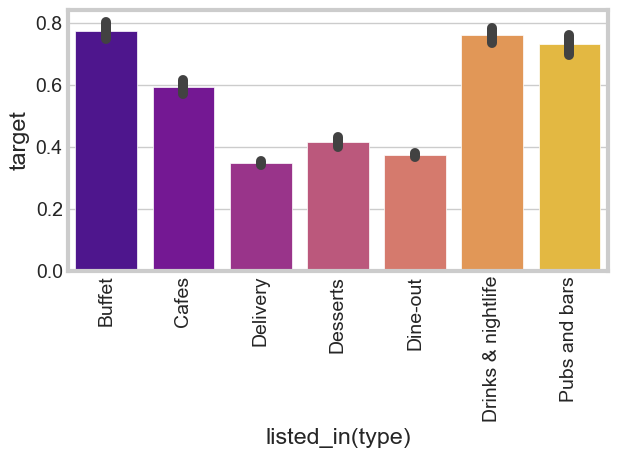

In [25]:
#which listed_in(type) has the highest target?
sns.barplot(data=zomato, x='listed_in(type)', y ='target',palette='plasma')
plt.xticks(rotation=90)
plt.tight_layout()

From the bar plot we can conclude that buffet is the highest type pf restaurant that makes success, while in the second and third place is the drinks& nightlife and pubs and bars

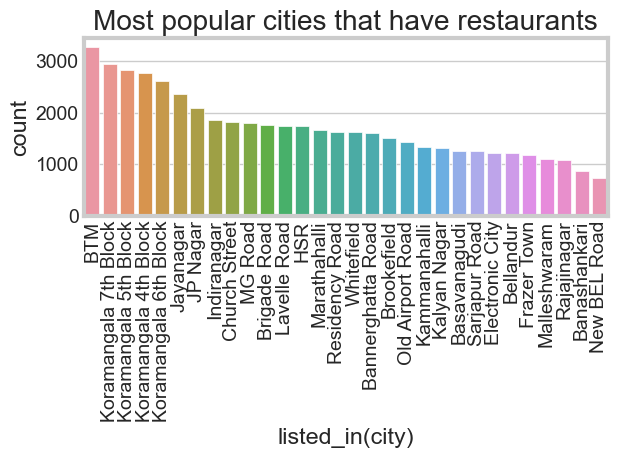

In [26]:
# what are most popular cities that have restaurant?
large_to_small = zomato.groupby('listed_in(city)').size().sort_values(ascending=False)
sns.countplot(x='listed_in(city)', data=zomato, order=large_to_small.index).set(title='Most popular cities that have restaurants')
plt.xticks(rotation=90)
plt.tight_layout()

We can conclude that BTM, Koramangala 7th,5th,4th and 6th are the top 5 popular cities 

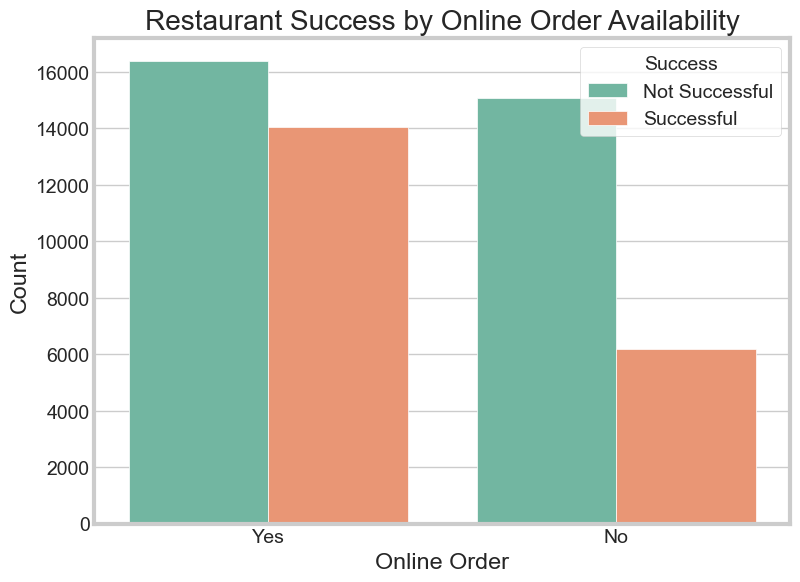

In [27]:
# Does offering online orders (Yes/No) have an impact on a restaurant's success (0/1)?
plt.figure(figsize=(8, 6))
sns.countplot(data=zomato, x='online_order', hue='target', palette='Set2')
plt.xlabel('Online Order')
plt.ylabel('Count')
plt.title('Restaurant Success by Online Order Availability')
plt.legend(title='Success', labels=['Not Successful', 'Successful'])
plt.show()

From the results we can conclude that not providing online order service can impact the success of the restaurant.

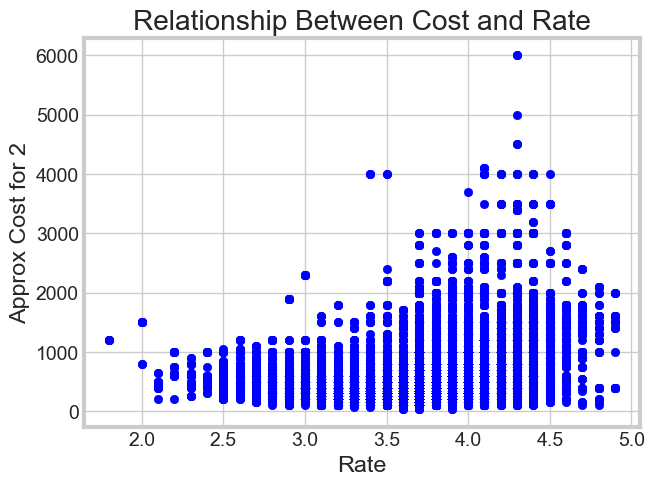

In [28]:
# Is there relationship between cost and rate number?
plt.scatter(zomato['rate'],zomato['approx_cost(for two people)'],label='rate vs cost for teo pwoplw', color='blue')
plt.xlabel('Rate')
plt.ylabel('Approx Cost for 2')
plt.title('Relationship Between Cost and Rate')
plt.show()

From the scatter plot we can inform that high-rated restaurants tend to have the high cost 

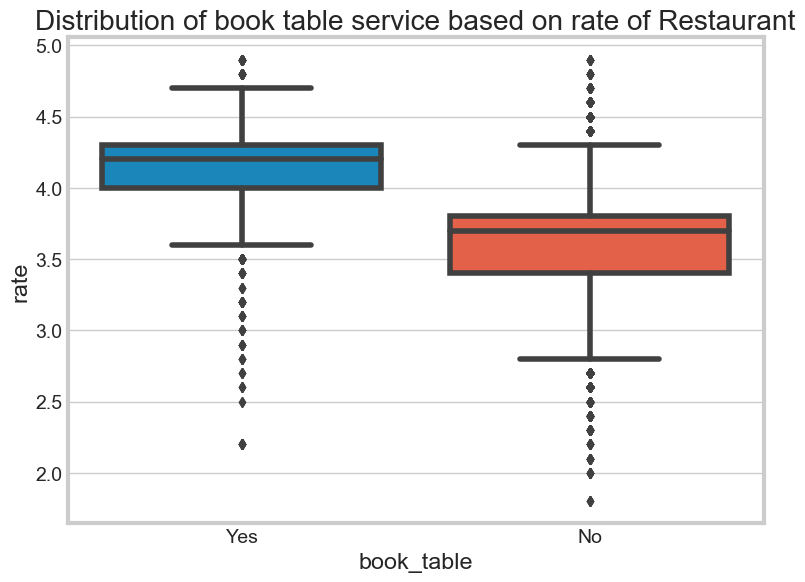

In [29]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='book_table', y='rate', data=zomato)
plt.title('Distribution of book table service based on rate of Restaurant')
plt.show()

from the box plot we can conclude that restaurants that doesn't provide book table service have low rate (3.5 according to median), while the median of restaurants with this service have higher rates

In [30]:
# Correlation between location and listed_in(city) columns to be able to drop location if the listed_in(city) column is dependant on it
from scipy.stats import chi2_contingency
contingency_table = pd.crosstab(zomato['location'], zomato['listed_in(city)'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-Squared Statistic: {chi2}")
print(f"P-Value: {p}")
print(f"Degrees of Freedom: {dof}")

Chi-Squared Statistic: 486698.82776867173
P-Value: 0.0
Degrees of Freedom: 2697


As the Pvalue is zero and chi-squared is very high then there is asscoiation between those columns which means we can drop location column

In [31]:
zomato=zomato.drop(['location'],axis=1)
zomato.head()

,name,online_order,book_table,rate,votes,rest_type,cuisines,approx_cost(for two people),listed_in(type),listed_in(city),target
0,Jalsa,Yes,Yes,4.1,775,Casual Dining,"North Indian, Mughlai, Chinese",800.0,Buffet,Banashankari,1
1,Spice Elephant,Yes,No,4.1,787,Casual Dining,others,800.0,Buffet,Banashankari,1
2,San Churro Cafe,Yes,No,3.8,918,others,others,800.0,Buffet,Banashankari,1
3,Addhuri Udupi Bhojana,No,No,3.7,88,Quick Bites,"South Indian, North Indian",300.0,Buffet,Banashankari,0
4,Grand Village,No,No,3.8,166,Casual Dining,others,600.0,Buffet,Banashankari,1


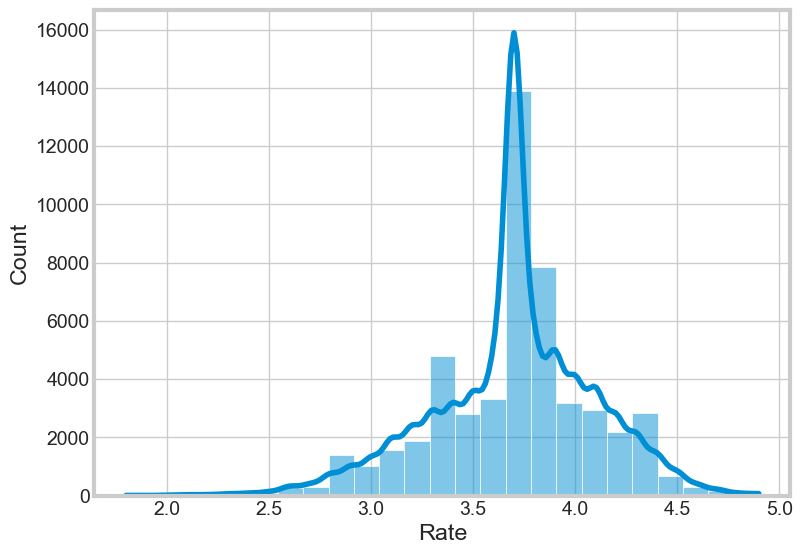

In [32]:
# distribution of rates
plt.figure(figsize=(8, 6))
sns.histplot(data = zomato, x = "rate",bins=25, kde = True)
plt.xlabel('Rate')
plt.show()

we can infer that most of rates are around 3.5

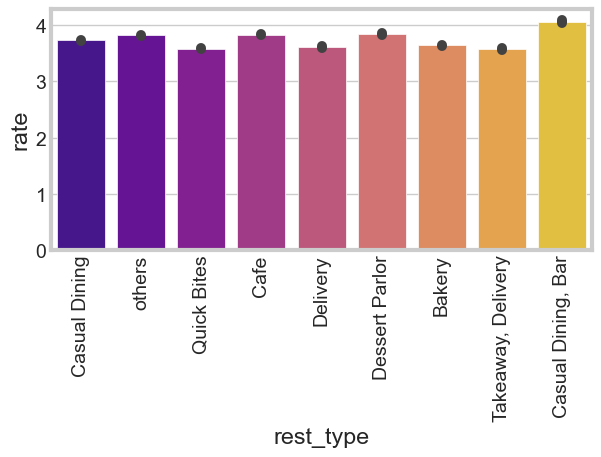

In [33]:
#What are the rest_type that have high rate?
sns.barplot(data=zomato, x='rest_type', y ='rate',palette='plasma')
plt.xticks(rotation=90)
plt.tight_layout()

We infer that casual dining,bars is the highest restauarant type with rates

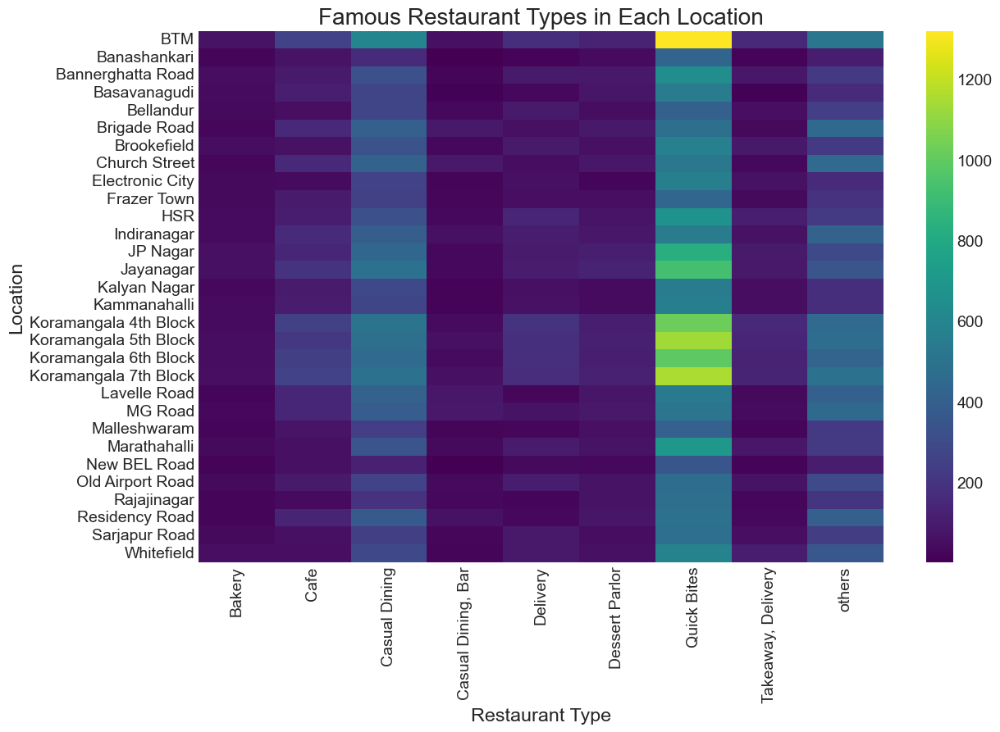

In [34]:
# what are famous rest_type in each location?
# Create a pivot table to count the frequency of each restaurant type in each location
pivot_table = pd.pivot_table(zomato, index='listed_in(city)', columns='rest_type', values='name', aggfunc='count', fill_value=0)
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='viridis', cbar=True)
plt.xlabel('Restaurant Type')
plt.ylabel('Location')
plt.title('Famous Restaurant Types in Each Location')
plt.show()

from this heatmap we can conclude that location BTM is famous  with Quick Bites, and also Quick Bites restaurant type is famous on Koramagala 7th block

In [35]:
zomato.head()

,name,online_order,book_table,rate,votes,rest_type,cuisines,approx_cost(for two people),listed_in(type),listed_in(city),target
0,Jalsa,Yes,Yes,4.1,775,Casual Dining,"North Indian, Mughlai, Chinese",800.0,Buffet,Banashankari,1
1,Spice Elephant,Yes,No,4.1,787,Casual Dining,others,800.0,Buffet,Banashankari,1
2,San Churro Cafe,Yes,No,3.8,918,others,others,800.0,Buffet,Banashankari,1
3,Addhuri Udupi Bhojana,No,No,3.7,88,Quick Bites,"South Indian, North Indian",300.0,Buffet,Banashankari,0
4,Grand Village,No,No,3.8,166,Casual Dining,others,600.0,Buffet,Banashankari,1


# Data Preperation before Modeling
-- We will encode each feature

In [36]:
df1=zomato.copy()
df1.head()

,name,online_order,book_table,rate,votes,rest_type,cuisines,approx_cost(for two people),listed_in(type),listed_in(city),target
0,Jalsa,Yes,Yes,4.1,775,Casual Dining,"North Indian, Mughlai, Chinese",800.0,Buffet,Banashankari,1
1,Spice Elephant,Yes,No,4.1,787,Casual Dining,others,800.0,Buffet,Banashankari,1
2,San Churro Cafe,Yes,No,3.8,918,others,others,800.0,Buffet,Banashankari,1
3,Addhuri Udupi Bhojana,No,No,3.7,88,Quick Bites,"South Indian, North Indian",300.0,Buffet,Banashankari,0
4,Grand Village,No,No,3.8,166,Casual Dining,others,600.0,Buffet,Banashankari,1


In [37]:
# label encoding
df1['rest_type']= df1['rest_type'].astype('category').cat.codes
df1['cuisines']= df1['cuisines'].astype('category').cat.codes
df1['listed_in(type)']= df1['listed_in(type)'].astype('category').cat.codes
df1['listed_in(city)']= df1['listed_in(city)'].astype('category').cat.codes

In [38]:
# we will drop name column as it is not important for analysis
df1=df1.drop(['name'],axis=1)

In [39]:
df1=df1.drop(['rate'],axis=1)

In [40]:
#one hot encoding for features with yes and no
categorical_columns = ['online_order','book_table']
df1 = pd.get_dummies(data=df1,
                           columns=categorical_columns,
                           dtype='int8')

In [41]:
df1.head()

,votes,rest_type,cuisines,approx_cost(for two people),listed_in(type),listed_in(city),target,online_order_No,online_order_Yes,book_table_No,book_table_Yes
0,775,2,54,800.0,0,1,1,0,1,0,1
1,787,2,69,800.0,0,1,1,0,1,1,0
2,918,8,69,800.0,0,1,1,0,1,1,0
3,88,6,65,300.0,0,1,0,1,0,1,0
4,166,2,69,600.0,0,1,1,1,0,1,0


In [42]:
df1.drop(['online_order_No','book_table_No'], axis='columns', inplace=True)
df1

,votes,rest_type,cuisines,approx_cost(for two people),listed_in(type),listed_in(city),target,online_order_Yes,book_table_Yes
0,775,2,54,800.0,0,1,1,1,1
1,787,2,69,800.0,0,1,1,1,0
2,918,8,69,800.0,0,1,1,1,0
3,88,6,65,300.0,0,1,0,0,0
4,166,2,69,600.0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...
51712,27,8,26,1500.0,6,29,0,0,0
51713,0,8,35,600.0,6,29,0,0,0
51714,0,8,35,2000.0,6,29,0,0,0
51715,236,8,35,2500.0,6,29,1,0,1


# Decision Tree Model

In [43]:
# here df1 that is used as we did label and one hot encoding as was seen before
from sklearn.model_selection import train_test_split

X = df1.drop('target', axis=1)
y = df1['target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [44]:
X

,votes,rest_type,cuisines,approx_cost(for two people),listed_in(type),listed_in(city),online_order_Yes,book_table_Yes
0,775,2,54,800.0,0,1,1,1
1,787,2,69,800.0,0,1,1,0
2,918,8,69,800.0,0,1,1,0
3,88,6,65,300.0,0,1,0,0
4,166,2,69,600.0,0,1,0,0
...,...,...,...,...,...,...,...,...
51712,27,8,26,1500.0,6,29,0,0
51713,0,8,35,600.0,6,29,0,0
51714,0,8,35,2000.0,6,29,0,0
51715,236,8,35,2500.0,6,29,0,1


In [45]:
from sklearn.tree import DecisionTreeClassifier
tree_clf = DecisionTreeClassifier(random_state=42)
tree_clf.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

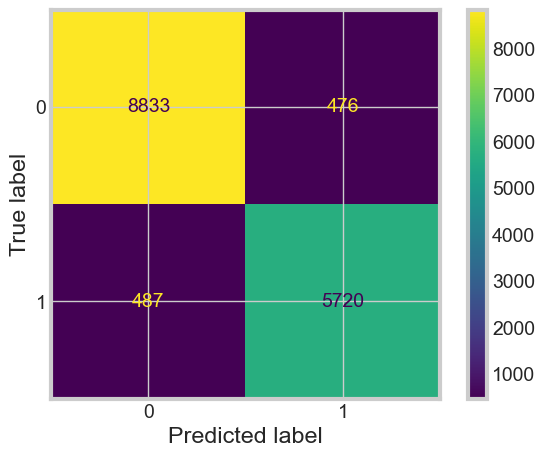

In [46]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
predictions = tree_clf.predict(X_test)
cm = confusion_matrix(y_test, predictions, labels=tree_clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                             display_labels=tree_clf.classes_)
disp.plot()
plt.show()

In [47]:
import graphviz
from sklearn.tree import export_graphviz
dot_data = export_graphviz(tree_clf, out_file=None,
                           feature_names=X.columns,
                           class_names=['No', 'Yes'],
                           filled=True, rounded=True,
                           special_characters=True) 
graph = graphviz.Source(dot_data)
graph

## Evaluation of The Decision Tree

In [48]:
from sklearn.metrics import accuracy_score, classification_report

def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:")
        print("===============================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:")
        print("===============================================")
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")

print_score(tree_clf, X_train, y_train, X_test, y_test, train=True)
print_score(tree_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 99.93%
_______________________________________________
CLASSIFICATION REPORT:
                      0             1  accuracy     macro avg  weighted avg
precision      0.998828      1.000000  0.999282      0.999414      0.999283
recall         1.000000      0.998148  0.999282      0.999074      0.999282
f1-score       0.999414      0.999073  0.999282      0.999243      0.999282
support    22164.000000  14037.000000  0.999282  36201.000000  36201.000000
_______________________________________________
Confusion Matrix: 
 [[22164     0]
 [   26 14011]]

Test Result:
Accuracy Score: 93.79%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy     macro avg  weighted avg
precision     0.947747     0.923176  0.937935      0.935462      0.937918
recall        0.948867     0.921540  0.937935      0.935203      0.937935
f1-score      0.948306     0.922357  0.937935      0.935332      0.937926
support  

## Cross validation for decision tree

In [49]:
from sklearn.model_selection import cross_val_score
k=5
scores = cross_val_score(tree_clf, X, y, cv=k, scoring='accuracy')
print("Cross-Validation Scores:", scores)
mean_accuracy = scores.mean()
print("Mean Accuracy:", mean_accuracy)

Cross-Validation Scores: [0.883314   0.89191802 0.9077637  0.95552548 0.86096877]
Mean Accuracy: 0.8998979941599426


## Random Forest

In [50]:
from sklearn.ensemble import RandomForestClassifier
rf_clf = RandomForestClassifier(n_estimators=50, random_state=42)
rf_clf.fit(X, y)

RandomForestClassifier(n_estimators=50, random_state=42)

## Evaluation of Random Forest Algorithm

In [51]:
print_score(rf_clf, X_train, y_train, X_test, y_test, train=True)
print_score(rf_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 99.87%
_______________________________________________
CLASSIFICATION REPORT:
                      0             1  accuracy     macro avg  weighted avg
precision      0.998647      0.998859  0.998729      0.998753      0.998729
recall         0.999278      0.997863  0.998729      0.998570      0.998729
f1-score       0.998963      0.998361  0.998729      0.998662      0.998729
support    22164.000000  14037.000000  0.998729  36201.000000  36201.000000
_______________________________________________
Confusion Matrix: 
 [[22148    16]
 [   30 14007]]

Test Result:
Accuracy Score: 99.81%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1  accuracy     macro avg  weighted avg
precision     0.997961     0.998387  0.998131      0.998174      0.998131
recall        0.998926     0.996939  0.998131      0.997932      0.998131
f1-score      0.998443     0.997662  0.998131      0.998053      0.998131
support  

## Logistic Regression Algorithm

In [52]:
# Initiating the model
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
lr_model = LogisticRegression(max_iter = 2000 )

In [60]:
# make cross validation for lR
scores_accuracy = cross_val_score(lr_model, X, y, cv=10, scoring='accuracy')
print('Accuracy Mean:' ,scores_accuracy.mean())
print('=======================================')
scores_precision = cross_val_score(lr_model, X, y, cv=10, scoring='precision')
print('Precision Mean:' ,scores_precision.mean())
print('=======================================')
scores_recall = cross_val_score(lr_model, X, y, cv=10, scoring='recall')
print('Recall Mean:' ,scores_recall.mean())
print('=======================================')
scores_f1_score = cross_val_score(lr_model, X, y, cv=10, scoring='f1')
print('F1_Score Mean:' ,scores_f1_score.mean())

Accuracy Mean: 0.8104112926468527
Precision Mean: 0.8554902492457123
Recall Mean: 0.6205809056751085
F1_Score Mean: 0.7185986438866422


In [61]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix
y_pred = cross_val_predict(lr_model, X, y, cv=10)
conf_mat = confusion_matrix(y, y_pred)
conf_mat

array([[29349,  2124],
       [ 7681, 12563]], dtype=int64)

## Implemnting SVM with GridSearch

In [54]:
#from sklearn.svm import SVC
#from sklearn.model_selection import GridSearchCV
#param_grid = { 'C': [0.1, 1, 10, 100, 1000], 'kernel': [ 'rbf'], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001]}
#grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3)
# fitting the model for grid search
#grid.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.612 total time= 7.8min


KeyboardInterrupt: 

In [ ]:
# print best parameter after tuning
#print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning
#print(grid.best_estimator_)

In [ ]:

#grid_predictions = grid.predict(X_test)
  
# print classification report
#print(classification_report(y_test, grid_predictions))

## Implemnting KNN 

In [55]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=5)

In [56]:
#Evaluating the models based on Accuracy, Precision, Recall and F1_Score
scores_accuracy = cross_val_score(knn_model, X, y, cv=10, scoring='accuracy')
print('Accuracy Mean:' ,scores_accuracy.mean())
print('=======================================')
scores_precision = cross_val_score(knn_model, X, y, cv=10, scoring='precision')
print('Precision Mean:' ,scores_precision.mean())
print('=======================================')
scores_recall = cross_val_score(knn_model, X, y, cv=10, scoring='recall')
print('Recall Mean:' ,scores_recall.mean())
print('=======================================')
scores_f1_score = cross_val_score(knn_model, X, y, cv=10, scoring='f1')
print('F1_Score Mean:' ,scores_f1_score.mean())

Accuracy Mean: 0.8789755781506805
Precision Mean: 0.8494977581516405
Recall Mean: 0.8389213389938026
F1_Score Mean: 0.8438682419002657


In [58]:
knn_model.fit(X, y)


KNeighborsClassifier()

In [62]:
y_pred = cross_val_predict(knn_model, X, y, cv=10)
conf_mat = confusion_matrix(y, y_pred)
conf_mat

array([[28475,  2998],
       [ 3261, 16983]], dtype=int64)